In [1]:
import torch
import torchaudio
from einops import rearrange
from stable_audio_tools import get_pretrained_model
from stable_audio_tools.inference.generation import generate_diffusion_cond
from audiotools import AudioSignal

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# Download model
model, model_config = get_pretrained_model("stabilityai/stable-audio-open-1.0")
sample_rate = model_config["sample_rate"]
sample_size = model_config["sample_size"]

model = model.to(device)

/usr/local/lib/python3.11/dist-packages/x_transformers/x_transformers.py:435: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)
/usr/local/lib/python3.11/dist-packages/x_transformers/x_transformers.py:461: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)
/workspace/stableaudiomodification/stable_audio_tools/models/transformer.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)
/workspace/stableaudiomodification/stable_audio_tools/models/transformer.py:151: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)


No module named 'flash_attn'
flash_attn not installed, disabling Flash Attention


/usr/local/lib/python3.11/dist-packages/vector_quantize_pytorch/vector_quantize_pytorch.py:436: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)
/usr/local/lib/python3.11/dist-packages/vector_quantize_pytorch/vector_quantize_pytorch.py:619: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled = False)
/usr/local/lib/python3.11/dist-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [ ]:

# oa = model.pretransform.encode

In [3]:
# Set up text and timing conditioning
conditioning = [{
    "prompt": "a cartoon laughing",
    "seconds_start": 0, 
    "seconds_total": 5
}]

# Generate stereo audio
output = generate_diffusion_cond(
    model,
    steps=100,
    cfg_scale=7,
    conditioning=conditioning,
    sample_size=sample_size,
    sigma_min=0.3,
    sigma_max=500,
    sampler_type="dpmpp-3m-sde",
    device=device
)

# Rearrange audio batch to a single sequence
output = rearrange(output, "b d n -> d (b n)")

1926838788


/workspace/stableaudiomodification/stable_audio_tools/models/conditioners.py:314: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float16) and torch.set_grad_enabled(self.enable_grad):


noise :  torch.Size([1, 64, 1024])
steps :  100
torch.Size([1, 64, 1024])
tensor([5.0000e+02, 4.6390e+02, 4.3041e+02, 3.9934e+02, 3.7051e+02, 3.4376e+02,
        3.1894e+02, 2.9591e+02, 2.7455e+02, 2.5473e+02, 2.3634e+02, 2.1927e+02,
        2.0344e+02, 1.8876e+02, 1.7513e+02, 1.6248e+02, 1.5075e+02, 1.3987e+02,
        1.2977e+02, 1.2040e+02, 1.1171e+02, 1.0364e+02, 9.6162e+01, 8.9219e+01,
        8.2778e+01, 7.6802e+01, 7.1257e+01, 6.6113e+01, 6.1339e+01, 5.6911e+01,
        5.2802e+01, 4.8990e+01, 4.5453e+01, 4.2172e+01, 3.9127e+01, 3.6302e+01,
        3.3681e+01, 3.1250e+01, 2.8994e+01, 2.6900e+01, 2.4958e+01, 2.3156e+01,
        2.1484e+01, 1.9933e+01, 1.8494e+01, 1.7159e+01, 1.5920e+01, 1.4771e+01,
        1.3704e+01, 1.2715e+01, 1.1797e+01, 1.0945e+01, 1.0155e+01, 9.4220e+00,
        8.7417e+00, 8.1106e+00, 7.5251e+00, 6.9818e+00, 6.4777e+00, 6.0101e+00,
        5.5761e+00, 5.1736e+00, 4.8001e+00, 4.4535e+00, 4.1320e+00, 3.8337e+00,
        3.5569e+00, 3.3001e+00, 3.0618e+00, 2.

/workspace/stableaudiomodification/stable_audio_tools/inference/sampling.py:177: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/100 [00:00<?, ?it/s]

/usr/lib/python3.11/contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/torchsde/_brownian/brownian_interval.py:608: UserWarning: Should have tb<=t1 but got tb=500.00006103515625 and t1=500.000061.
  warnings.warn(f"Should have {tb_name}<=t1 but got {tb_name}={tb} and t1={self._end}.")


/usr/local/lib/python3.11/dist-packages/audiotools/core/audio_signal.py:601: UserWarning: Audio amplitude > 1 clipped when saving
  warnings.warn("Audio amplitude > 1 clipped when saving")



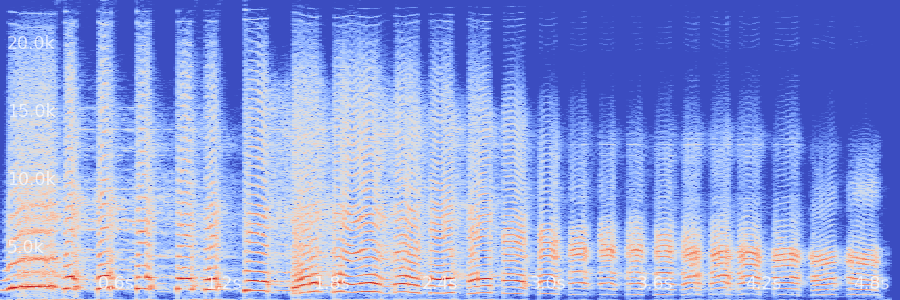
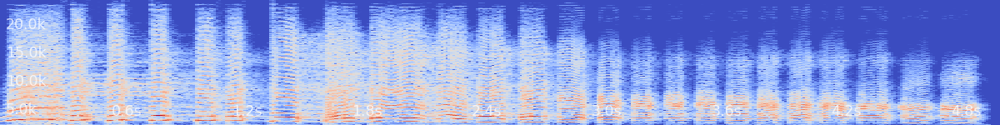

In [4]:
AudioSignal(output.cpu()[:, :conditioning[0]['seconds_total']*44100], sample_rate=sample_rate).widget()

In [ ]:
torch.save(model.model.model.state_dict(), 'model_weight.pt')

In [ ]:
# Peak normalize, clip, convert to int16, and save to file
output = output.to(torch.float32).div(torch.max(torch.abs(output))).clamp(-1, 1).mul(32767).to(torch.int16).cpu()
torchaudio.save("output.wav", output, sample_rate)

from audiotools import AudioSignal

/usr/local/lib/python3.11/dist-packages/audiotools/core/audio_signal.py:601: UserWarning: Audio amplitude > 1 clipped when saving
  warnings.warn("Audio amplitude > 1 clipped when saving")



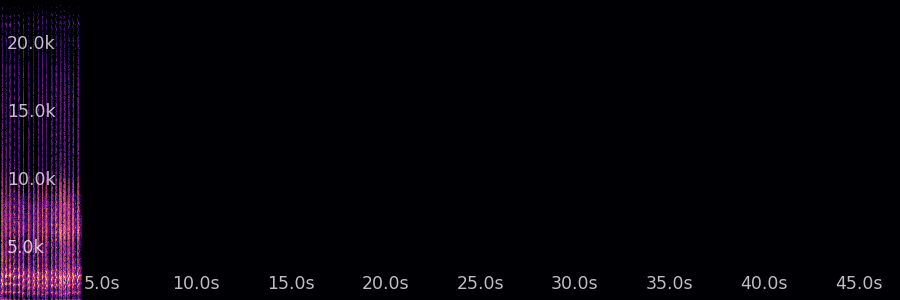
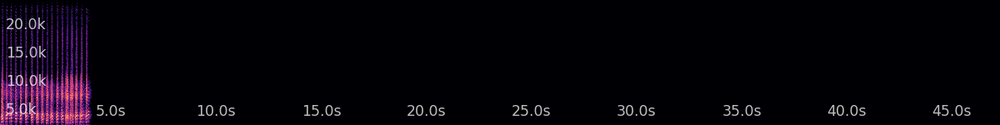

In [4]:
AudioSignal(output.cpu(), sample_rate=sample_rate).widget()

In [ ]:
import torch
import soundfile as sf
from diffusers import StableAudioPipeline

pipe = StableAudioPipeline.from_pretrained("stabilityai/stable-audio-open-1.0", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

In [ ]:
from audiotools import AudioSignal

asa = AudioSignal('./test2.wav').resample(48000)
asa2 = AudioSignal('./test.wav').resample(48000)

In [ ]:
print(asa._audio_data.shape)
print(asa2._audio_data.shape)
print(asa.sample_rate)
print(asa2.sample_rate)
print(asa.duration)
print(asa2.duration)

sample = torch.stack([asa._audio_data.squeeze(), asa._audio_data.squeeze()]).to(device).unsqueeze(dim=0)
sample.shape

In [ ]:
res = model.pretransform.encode(sample)
# res = model.pretransform.encode(asa2._audio_data.to(device))

In [ ]:
res.shape

In [ ]:
from transformers import EncodecModel, AutoProcessor

# load the model + processor (for pre-processing the audio)
model = EncodecModel.from_pretrained("facebook/encodec_48khz").to(device)
processor = AutoProcessor.from_pretrained("facebook/encodec_48khz")

In [ ]:
# pre-process the inputs
inputs = processor(raw_audio=sample.cpu().squeeze(), sampling_rate=processor.sampling_rate, return_tensors="pt")

# explicitly encode then decode the audio inputs
encoder_outputs = model.encode(inputs["input_values"].to(device), inputs["padding_mask"].to(device))

In [ ]:
encoder_outputs.audio_codes.shape